In [1]:
from rdkit import Chem
from rdkit.Chem import Descriptors
import pandas as pd
import numpy as np
import random
import os
os.environ['R_HOME'] = 'C:\Programming\R\R-4.4.2'

In [2]:
# 재현성 난수 고정
SEED = 100

os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

random.seed(SEED)
np.random.seed(SEED)

In [3]:
# data load
df_name = 'lipo'
df = pd.read_csv('C:\Programming\Github\EGCN\data\\' + df_name + '.csv')

smiles_list = df['smiles'].tolist()

# target 정의
target = df.iloc[:,-1]

print(smiles_list[:5])
print(target[:5])

['Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14', 'COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)CCc3ccccc23', 'COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl', 'OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(Cl)sc4[nH]3', 'Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)NCC#N)c1']
0    3.54
1   -1.18
2    3.69
3    3.37
4    3.10
Name: lipo, dtype: float64


In [4]:
# 분자 특성 추출 class
class MolecularFeatureExtractor:
    def __init__(self):
        self.descriptors = [desc[0] for desc in Descriptors._descList]

    def extract_molecular_features(self, smiles_list):
        features_dict = {desc: [] for desc in self.descriptors}

        for smiles in smiles_list:
            mol = Chem.MolFromSmiles(smiles)
            if mol:
                for descriptor_name in self.descriptors:
                    descriptor_function = getattr(Descriptors, descriptor_name)
                    try:
                        features_dict[descriptor_name].append(descriptor_function(mol))
                    except:
                        features_dict[descriptor_name].append(None)
            else:
                for descriptor_name in self.descriptors:
                    features_dict[descriptor_name].append(None)

        return pd.DataFrame(features_dict)

In [5]:
# 분자 특성 추출 및 데이터프레임 정의
extractor = MolecularFeatureExtractor()
df_all_features = extractor.extract_molecular_features(smiles_list)

df_all_features['target'] = target
df_all_features.head()

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,target
0,5.976320,0.790958,5.976320,0.790958,0.728444,340.858,319.690,340.145474,124,0,...,0,0,0,0,0,0,0,0,0,3.54
1,13.847757,-4.060285,13.847757,0.083663,0.545587,494.591,468.383,494.118143,178,0,...,1,0,0,0,0,0,0,0,0,-1.18
2,12.294248,-0.447454,12.294248,0.262241,0.807761,321.829,305.701,321.059027,110,0,...,0,0,0,0,0,0,1,0,0,3.69
3,12.966133,-1.063518,12.966133,0.046181,0.506650,419.890,401.746,419.070655,146,0,...,0,0,0,0,0,0,1,0,0,3.37
4,12.834652,-0.795707,12.834652,0.112199,0.747686,381.480,354.264,381.216475,148,0,...,0,0,0,0,0,0,0,0,0,3.10


In [6]:
num_all_features = df_all_features.shape[1] - 1  # logvp 열 제외
print("초기 변수 개수:", num_all_features)

초기 변수 개수: 208


# 1. NA Handling

In [7]:
# NA 확인
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
df_all_features[df_all_features.isna().any(axis = 1)]

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA8,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA9,TPSA,EState_VSA1,EState_VSA10,EState_VSA11,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR,fr_Al_COO,fr_Al_OH,fr_Al_OH_noTert,fr_ArN,fr_Ar_COO,fr_Ar_N,fr_Ar_NH,fr_Ar_OH,fr_COO,fr_COO2,fr_C_O,fr_C_O_noCOO,fr_C_S,fr_HOCCN,fr_Imine,fr_NH0,fr_NH1,fr_NH2,fr_N_O,fr_Ndealkylation1,fr_Ndealkylation2,fr_Nhpyrrole,fr_SH,fr_aldehyde,fr_alkyl_carbamate,fr_alkyl_halide,fr_allylic_oxid,fr_amide,fr_amidine,fr_aniline,fr_aryl_methyl,fr_azide,fr_azo,fr_barbitur,fr_benzene,fr_benzodiazepine,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,target
1561,12.138731,0.078403,12.138731,0.078403,0.622431,274.181,265.109,274.984935,78,0,NaN,NaN,NaN,NaN,0.875,1.5625,2.3125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.339042,681.724018,10.957819,8.459863,10.172935,7.860173,5.02607,6.648715,3.522526,5.594479,2.482263,4.815131,1.70548,3.799793,-1.570519,9923.302413,9.640986,3.779548,1.452937,98.738738,0.0,0.0,0.0,0.0,0.0,98.579986,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.379009,0.0,3.562482,0.0,0.0,0.0,64.951108,0.0,5.687386,5.559267,0.0,0.0,0.0,18.295119,0.0,0.0,0.0,59.391841,0.0,15.333759,0.0,22.0,0.0,4.794537,0.0,20.291904,0.0,11.07361,4.260148,0.0,58.159786,0.0,0.0,3.04292,0.078403,12.138731,0.853105,1.116204,0.0,17.687305,0.0,0.0,0.0,0.0,16,0,2,0,0,0,2,1,3,2,0,3,1,0,0,0,3,2.0477,66.485,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3.31


In [8]:
# 결측치가 포함된 feature 개수
print('결측치가 포함된 열 개수:', df_all_features.isna().any(axis = 0).sum(), '\n')
print(df_all_features.isna().any(axis = 0))

결측치가 포함된 열 개수: 12 

MaxEStateIndex              False
MinEStateIndex              False
MaxAbsEStateIndex           False
MinAbsEStateIndex           False
qed                         False
MolWt                       False
HeavyAtomMolWt              False
ExactMolWt                  False
NumValenceElectrons         False
NumRadicalElectrons         False
MaxPartialCharge             True
MinPartialCharge             True
MaxAbsPartialCharge          True
MinAbsPartialCharge          True
FpDensityMorgan1            False
FpDensityMorgan2            False
FpDensityMorgan3            False
BCUT2D_MWHI                  True
BCUT2D_MWLOW                 True
BCUT2D_CHGHI                 True
BCUT2D_CHGLO                 True
BCUT2D_LOGPHI                True
BCUT2D_LOGPLOW               True
BCUT2D_MRHI                  True
BCUT2D_MRLOW                 True
BalabanJ                    False
BertzCT                     False
Chi0                        False
Chi0n                       

In [9]:
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')

In [10]:
# 결측치가 포함된 feature 제거
df_removed_features = df_all_features.dropna(axis = 1)
num_removed_features = df_removed_features.shape[1] - 1  # logvp 열 제외

print("제거 후 남은 feature 개수:", num_removed_features)

제거 후 남은 feature 개수: 196


In [11]:
# 결측치가 제거된 data frame
df_removed_features

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,target
0,5.976320,0.790958,5.976320,0.790958,0.728444,340.858,319.690,340.145474,124,0,...,0,0,0,0,0,0,0,0,0,3.54
1,13.847757,-4.060285,13.847757,0.083663,0.545587,494.591,468.383,494.118143,178,0,...,1,0,0,0,0,0,0,0,0,-1.18
2,12.294248,-0.447454,12.294248,0.262241,0.807761,321.829,305.701,321.059027,110,0,...,0,0,0,0,0,0,1,0,0,3.69
3,12.966133,-1.063518,12.966133,0.046181,0.506650,419.890,401.746,419.070655,146,0,...,0,0,0,0,0,0,1,0,0,3.37
4,12.834652,-0.795707,12.834652,0.112199,0.747686,381.480,354.264,381.216475,148,0,...,0,0,0,0,0,0,0,0,0,3.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,12.263937,-0.206268,12.263937,0.114415,0.688505,314.772,299.652,314.082205,112,0,...,0,0,0,0,0,0,0,0,0,3.85
4196,13.543113,-3.267070,13.543113,0.034005,0.334738,554.703,518.415,554.241470,208,0,...,0,1,0,0,0,0,0,0,0,3.21
4197,5.125787,0.857639,5.125787,0.857639,0.666148,148.165,140.101,148.063663,56,0,...,0,0,0,0,0,0,0,0,0,2.10
4198,12.498811,-0.093358,12.498811,0.093358,0.923057,302.805,283.653,302.118591,110,0,...,0,0,0,0,0,0,0,0,0,2.65


# 2. nunique == 1 인 경우

In [12]:
unique_columns = list(df_removed_features.loc[:, df_removed_features.nunique() == 1].columns)
print('nunique == 1인 feature : \n', unique_columns, '\n')

# nunique == 1인 feature 제거
#df_removed_features.drop(columns = unique_columns, inplace = True)
df_removed_features = df_removed_features.drop(columns = unique_columns).copy()

num_removed_features = df_removed_features.shape[1] - 1  # logvp 열 제외

print("제거 후 남은 feature 개수:", num_removed_features, '\n')
print(df_removed_features.shape)


nunique == 1인 feature : 
 ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_azide', 'fr_diazo', 'fr_isocyan', 'fr_isothiocyan', 'fr_nitroso', 'fr_prisulfonamd', 'fr_thiocyan'] 

제거 후 남은 feature 개수: 186 

(4200, 187)


In [13]:
df_removed_features

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,FpDensityMorgan1,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea,target
0,5.976320,0.790958,5.976320,0.790958,0.728444,340.858,319.690,340.145474,124,0.958333,...,0,0,0,0,0,0,0,0,0,3.54
1,13.847757,-4.060285,13.847757,0.083663,0.545587,494.591,468.383,494.118143,178,1.151515,...,1,1,0,0,0,0,0,0,0,-1.18
2,12.294248,-0.447454,12.294248,0.262241,0.807761,321.829,305.701,321.059027,110,1.380952,...,0,0,0,0,0,0,1,0,0,3.69
3,12.966133,-1.063518,12.966133,0.046181,0.506650,419.890,401.746,419.070655,146,1.392857,...,0,0,0,0,0,0,1,0,0,3.37
4,12.834652,-0.795707,12.834652,0.112199,0.747686,381.480,354.264,381.216475,148,1.285714,...,0,0,0,0,0,0,0,0,0,3.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,12.263937,-0.206268,12.263937,0.114415,0.688505,314.772,299.652,314.082205,112,1.136364,...,0,0,0,0,0,0,0,0,0,3.85
4196,13.543113,-3.267070,13.543113,0.034005,0.334738,554.703,518.415,554.241470,208,0.897436,...,0,0,1,0,0,0,0,0,0,3.21
4197,5.125787,0.857639,5.125787,0.857639,0.666148,148.165,140.101,148.063663,56,1.454545,...,0,0,0,0,0,0,0,0,0,2.10
4198,12.498811,-0.093358,12.498811,0.093358,0.923057,302.805,283.653,302.118591,110,1.238095,...,0,0,0,0,0,0,0,0,0,2.65


# 3. 너무 낮은 variance를 가지는 경우

In [14]:
low_variances = sorted(df_removed_features.var())
low_variances[:10]

[0.00047607707050431505,
 0.00047607707050431505,
 0.00047607707050431516,
 0.00047607707050431516,
 0.0007139454972272311,
 0.0009517005182639854,
 0.0009517005182639855,
 0.0011893421336145792,
 0.0011893421336145794,
 0.0016642851472572838]

In [15]:
columns_low_variances = []

for i in low_variances:
    if i < 0.001:
        column = df_removed_features.loc[:, df_removed_features.var() == i].columns
        columns_low_variances.append(column)
columns_low_variances = [item for index in columns_low_variances for item in index]

# 2. 중복 제거 및 유니크 값 추출
columns_low_variances = list(set(columns_low_variances))
print(columns_low_variances)

['fr_azo', 'fr_epoxide', 'fr_phos_ester', 'fr_lactam', 'fr_quatN', 'fr_phos_acid', 'fr_barbitur']


In [16]:
# 낮은 분산의 변수 제거
df_removed_features = df_removed_features.drop(columns = columns_low_variances).copy()
num_removed_features = df_removed_features.shape[1] - 1  # logvp 열 제외

print("제거 후 남은 feature 개수:", num_removed_features, '\n')
print(df_removed_features.shape)

제거 후 남은 feature 개수: 179 

(4200, 180)


In [17]:
print("제거 후 남은 feature 개수:", num_removed_features, '\n')
print(df_removed_features.shape)

제거 후 남은 feature 개수: 179 

(4200, 180)


In [18]:
df_removed_features

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,FpDensityMorgan1,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea,target
0,5.976320,0.790958,5.976320,0.790958,0.728444,340.858,319.690,340.145474,124,0.958333,...,0,0,0,0,0,0,0,0,0,3.54
1,13.847757,-4.060285,13.847757,0.083663,0.545587,494.591,468.383,494.118143,178,1.151515,...,1,1,0,0,0,0,0,0,0,-1.18
2,12.294248,-0.447454,12.294248,0.262241,0.807761,321.829,305.701,321.059027,110,1.380952,...,0,0,0,0,0,0,1,0,0,3.69
3,12.966133,-1.063518,12.966133,0.046181,0.506650,419.890,401.746,419.070655,146,1.392857,...,0,0,0,0,0,0,1,0,0,3.37
4,12.834652,-0.795707,12.834652,0.112199,0.747686,381.480,354.264,381.216475,148,1.285714,...,0,0,0,0,0,0,0,0,0,3.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,12.263937,-0.206268,12.263937,0.114415,0.688505,314.772,299.652,314.082205,112,1.136364,...,0,0,0,0,0,0,0,0,0,3.85
4196,13.543113,-3.267070,13.543113,0.034005,0.334738,554.703,518.415,554.241470,208,0.897436,...,0,0,1,0,0,0,0,0,0,3.21
4197,5.125787,0.857639,5.125787,0.857639,0.666148,148.165,140.101,148.063663,56,1.454545,...,0,0,0,0,0,0,0,0,0,2.10
4198,12.498811,-0.093358,12.498811,0.093358,0.923057,302.805,283.653,302.118591,110,1.238095,...,0,0,0,0,0,0,0,0,0,2.65


# 4. 데이터 스크리닝 (ISIS)

In [19]:
X_train = df_removed_features.drop(columns = 'target')
y_train = df_removed_features['target']

print(X_train.shape)
print(y_train.shape)

(4200, 179)
(4200,)


In [20]:
# 스케일링
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaling = scaler.transform(X_train)
print(X_train_scaling.shape)

(4200, 179)


In [21]:
# Python to R type
from rpy2.robjects import r
from rpy2.robjects import pandas2ri
from rpy2.robjects import FloatVector

pandas2ri.activate()

X_train_scaling = r['as.matrix'](X_train_scaling)

y_train = FloatVector(y_train)

nfolds = 10
nfolds = FloatVector([nfolds])[0]

nsis = 100
nsis = FloatVector([nsis])[0]

seed = 9
seed = FloatVector([seed])[0]

In [22]:
from rpy2.robjects.packages import importr
import sys
import io

SIS = importr('SIS')

# R 출력이 발생할 때 UTF-8 오류를 방지하기 위해, 표준 출력을 임시로 바꿔서 처리할 수 있습니다.
#r('Sys.setlocale("LC_ALL", "C.UTF-8")')

# model1 = SIS(...)
model1 = SIS.SIS(X_train_scaling,y_train,
    family="gaussian",
#    penalty="MCP",
    tune="cv",
    nfolds=nfolds,
    nsis=nsis,
    varISIS="aggr",
    seed=seed,
    q = 0.95,
    standardize=False)


Iter 1 , screening:  2 5 6 7 8 9 10 11 13 14 15 16 17 18 19 20 21 22 23 24 25 27 29 30 32 38 43 44 45 54 57 64 66 67 68 72 73 76 77 82 84 85 88 90 91 96 97 98 100 106 107 108 109 113 114 117 118 124 126 138 140 172 
Iter 1 , selection:  2 5 10 13 44 54 57 66 68 72 76 77 82 84 91 97 107 114 117 172 
Iter 1 , conditional-screening:  11 19 23 25 28 36 37 43 46 48 50 53 55 56 58 59 60 61 69 74 79 81 85 87 89 93 94 96 98 99 100 101 103 104 110 111 112 118 119 120 122 124 125 137 140 145 167 170 171 
Iter 2 , screening:  2 5 10 11 13 19 23 25 28 36 37 43 44 46 48 50 53 54 55 56 57 58 59 60 61 66 68 69 72 74 76 77 79 81 82 84 85 87 89 91 93 94 96 97 98 99 100 101 103 104 107 110 111 112 114 117 118 119 120 122 124 125 137 140 145 167 170 171 172 
Iter 2 , selection:  5 10 13 28 36 37 43 44 48 56 57 61 68 74 81 82 84 94 97 99 103 107 117 122 125 137 145 170 171 
Iter 2 , conditional-screening:  2 6 7 8 11 12 14 20 23 24 25 26 27 31 34 59 62 69 71 83 85 89 90 91 92 95 100 101 102 104 105 118 12

In [23]:
print(str(model1))

$sis.ix0
 [1]   2   5   6   7   8   9  10  11  13  14  15  16  17  18  19  20  21  22  23
[20]  24  25  27  29  30  32  38  43  44  45  54  57  64  66  67  68  72  73  76
[39]  77  82  84  85  88  90  91  96  97  98 100 106 107 108 109 113 114 117 118
[58] 124 126 138 140 172

$ix
 [1]   1   2   4   5  10  12  26  28  36  37  43  47  48  57  62  74  81  84  97
[20]  99 103 107 117 122 125 126 137 142 146 147 155 161 165 168 170 171 178

$coef.est
 (Intercept)           X1           X2           X4           X5          X10 
 2.186335714  0.125500988  0.091347201  0.101388517  0.132690991 -0.271254483 
         X12          X26          X28          X36          X37          X43 
 0.196293411 -0.215500645  0.127530658  0.027033127 -0.193575762  0.183505001 
         X47          X48          X57          X62          X74          X81 
 0.356388188  0.205013215  0.159761403  0.072730773 -0.043598703  0.157207545 
         X84          X97          X99         X103         X107         X1

In [24]:
print(df_removed_features.shape)
print('\n')
print(df_removed_features.columns)


(4200, 180)


Index(['MaxEStateIndex', 'MinEStateIndex', 'MaxAbsEStateIndex',
       'MinAbsEStateIndex', 'qed', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt',
       'NumValenceElectrons', 'FpDensityMorgan1',
       ...
       'fr_sulfide', 'fr_sulfonamd', 'fr_sulfone', 'fr_term_acetylene',
       'fr_tetrazole', 'fr_thiazole', 'fr_thiophene', 'fr_unbrch_alkane',
       'fr_urea', 'target'],
      dtype='object', length=180)


In [25]:
# 선택된 feature들의 index
selected_features_ISIS = np.array(model1.rx2('ix'))

# R은 index가 1부터 시작하므로 python에 맞게 보정
selected_features_ISIS = selected_features_ISIS - 1
selected_features_ISIS

array([  0,   1,   3,   4,   9,  11,  25,  27,  35,  36,  42,  46,  47,
        56,  61,  73,  80,  83,  96,  98, 102, 106, 116, 121, 124, 125,
       136, 141, 145, 146, 154, 160, 164, 167, 169, 170, 177])

In [26]:
df_removed_features_columns = df_removed_features.columns
print(f'ISIS 적용 전 features: {df_removed_features_columns.size}개')
print(df_removed_features_columns, '\n')

selected_features = df_removed_features_columns[selected_features_ISIS]
print(f'ISIS 적용 후 features: {selected_features.size}개')
print(selected_features)

ISIS 적용 전 features: 180개
Index(['MaxEStateIndex', 'MinEStateIndex', 'MaxAbsEStateIndex',
       'MinAbsEStateIndex', 'qed', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt',
       'NumValenceElectrons', 'FpDensityMorgan1',
       ...
       'fr_sulfide', 'fr_sulfonamd', 'fr_sulfone', 'fr_term_acetylene',
       'fr_tetrazole', 'fr_thiazole', 'fr_thiophene', 'fr_unbrch_alkane',
       'fr_urea', 'target'],
      dtype='object', length=180) 

ISIS 적용 후 features: 37개
Index(['MaxEStateIndex', 'MinEStateIndex', 'MinAbsEStateIndex', 'qed',
       'FpDensityMorgan1', 'FpDensityMorgan3', 'Chi4v', 'Ipc', 'PEOE_VSA12',
       'PEOE_VSA13', 'PEOE_VSA6', 'SMR_VSA1', 'SMR_VSA10', 'SlogP_VSA10',
       'SlogP_VSA4', 'EState_VSA5', 'VSA_EState2', 'VSA_EState5',
       'NumAromaticHeterocycles', 'NumHAcceptors', 'NumSaturatedCarbocycles',
       'MolLogP', 'fr_COO', 'fr_HOCCN', 'fr_NH1', 'fr_NH2', 'fr_amidine',
       'fr_bicyclic', 'fr_furan', 'fr_guanido', 'fr_lactone',
       'fr_nitro_arom_nonortho', 'fr_

In [27]:
df_ISIS = df_removed_features[list(selected_features) + ['target']]
df_ISIS

,MaxEStateIndex,MinEStateIndex,MinAbsEStateIndex,qed,FpDensityMorgan1,FpDensityMorgan3,Chi4v,Ipc,PEOE_VSA12,PEOE_VSA13,...,fr_furan,fr_guanido,fr_lactone,fr_nitro_arom_nonortho,fr_phenol,fr_piperzine,fr_pyridine,fr_sulfide,fr_unbrch_alkane,target
0,5.976320,0.790958,0.790958,0.728444,0.958333,2.375000,3.478915,5.589050e+05,0.000000,0.000000,...,0,0,0,0,0,1,0,0,0,3.54
1,13.847757,-4.060285,0.083663,0.545587,1.151515,2.515152,6.140635,1.604999e+07,5.907180,10.023291,...,0,0,0,0,0,0,0,1,0,-1.18
2,12.294248,-0.447454,0.262241,0.807761,1.380952,2.952381,3.900656,1.026542e+05,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,3.69
3,12.966133,-1.063518,0.046181,0.506650,1.392857,2.928571,4.507775,3.046776e+06,5.907180,5.907180,...,0,0,0,0,0,0,0,0,0,3.37
4,12.834652,-0.795707,0.112199,0.747686,1.285714,2.571429,2.812391,1.167535e+06,5.907180,5.907180,...,0,0,0,0,0,0,0,0,0,3.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,12.263937,-0.206268,0.114415,0.688505,1.136364,2.636364,2.488639,1.489745e+05,0.000000,5.907180,...,0,0,0,0,0,0,0,0,0,3.85
4196,13.543113,-3.267070,0.034005,0.334738,0.897436,1.871795,6.081569,4.117455e+08,5.907180,0.000000,...,0,0,0,0,0,0,0,0,0,3.21
4197,5.125787,0.857639,0.857639,0.666148,1.454545,3.181818,1.119043,6.682570e+02,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,2.10
4198,12.498811,-0.093358,0.093358,0.923057,1.238095,2.857143,3.323888,9.014600e+04,0.000000,5.907180,...,0,0,0,0,0,0,1,0,0,2.65


# 5. 엘라스틱 넷

In [28]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.model_selection import KFold
from sklearn.feature_selection import RFE

In [29]:
X_ISIS = df_ISIS.drop(columns = ['target'])
y_ISIS = df_ISIS['target']

# train / test split
X_train, X_test, y_train, y_test = train_test_split(X_ISIS, y_ISIS, test_size = 0.2, random_state = SEED)

# scaling
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaling = scaler.transform(X_train)
X_test_scaling = scaler.transform(X_test)

print(X_train_scaling.shape)
print(X_test_scaling.shape)

(3360, 37)
(840, 37)


In [30]:
# ElasticNet 모델과 하이퍼파라미터 범위 설정
elastic_net = ElasticNet(max_iter = 5000)
param_grid = {
    'alpha': [0.001, 0.01, 0.1, 1.0, 10.0],  # 정규화 강도
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 1.0]  # L1과 L2 비율
}

kfold = KFold(n_splits = 5, shuffle = True, random_state = SEED)

# GridSearchCV를 사용하여 최적 하이퍼파라미터 탐색
grid_search = GridSearchCV(
    estimator = elastic_net,
    param_grid = param_grid,
    scoring = 'neg_mean_squared_error',
    cv = kfold,
    verbose = 1,
    n_jobs = -1
)

grid_search.fit(X_train_scaling, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=100, shuffle=True),
             estimator=ElasticNet(max_iter=5000), n_jobs=-1,
             param_grid={'alpha': [0.001, 0.01, 0.1, 1.0, 10.0],
                         'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 1.0]},
             scoring='neg_mean_squared_error', verbose=1)

In [31]:
best_params = grid_search.best_params_
print(best_params)

{'alpha': 0.001, 'l1_ratio': 0.1}


In [32]:
# 최적 하이퍼파라미터로 ElasticNet 모델 생성
best_params = grid_search.best_params_

best_elastic_net = ElasticNet(
    alpha = best_params['alpha'],
    l1_ratio = best_params['l1_ratio'],
    max_iter = 5000,
    fit_intercept=True
)

In [33]:
X_train

,MaxEStateIndex,MinEStateIndex,MinAbsEStateIndex,qed,FpDensityMorgan1,FpDensityMorgan3,Chi4v,Ipc,PEOE_VSA12,PEOE_VSA13,...,fr_bicyclic,fr_furan,fr_guanido,fr_lactone,fr_nitro_arom_nonortho,fr_phenol,fr_piperzine,fr_pyridine,fr_sulfide,fr_unbrch_alkane
4113,5.908001,0.597151,0.597151,0.709007,1.125000,2.812500,2.589945,8.389187e+03,0.000000,0.000000,...,3,0,0,0,0,0,0,1,0,0
309,5.523346,0.619308,0.619308,0.724186,1.166667,2.500000,1.601330,1.054808e+03,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
1833,11.725970,-0.364564,0.121535,0.811221,1.409091,2.909091,3.731923,1.197714e+05,0.000000,11.146391,...,0,0,0,0,0,0,0,0,1,0
4084,2.634696,0.766040,0.766040,0.786002,0.750000,2.000000,3.896061,9.482927e+04,0.000000,0.000000,...,3,0,0,0,0,0,0,0,0,0
1625,11.556507,-0.765294,0.007827,0.309665,1.033333,2.600000,4.024545,7.630253e+06,0.000000,0.000000,...,1,0,0,0,0,1,0,0,0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4149,13.291906,-0.317437,0.038216,0.609779,1.166667,2.633333,4.201718,6.378268e+06,0.000000,5.559267,...,1,0,0,0,0,0,0,0,0,0
1890,13.645989,-0.685739,0.061540,0.754039,1.176471,2.588235,5.816526,7.951349e+07,11.814359,0.000000,...,1,0,0,0,0,0,1,0,0,0
350,13.071760,-3.972875,0.025121,0.515177,1.096774,2.354839,4.357530,8.266057e+06,0.000000,15.930471,...,0,0,0,0,0,0,0,0,0,0
79,14.983653,-1.315329,0.043359,0.874740,1.307692,2.653846,3.688770,8.253937e+05,5.428790,0.000000,...,0,0,0,0,0,0,1,1,0,0


In [34]:
# 학습
best_elastic_net.fit(X_train_scaling, y_train)

# 회귀 계수
coefficients = best_elastic_net.coef_

# feature와 계수 매핑
final_selected_features = pd.DataFrame({'Feature' : X_train.columns,
                                       'Coefficient' : coefficients})
# 계수
final_selected_features = abs(final_selected_features['Coefficient']).sort_values(ascending = False)
final_selected_features_index = final_selected_features.index
final_selected_features_index

Index([22, 21, 18, 11,  4, 19, 24,  5,  6, 12, 10, 17, 13,  9, 34, 20, 16,  0,
        3,  2,  1, 14, 36, 23, 35, 15, 31,  7, 32, 27,  8, 29, 30, 28, 33, 25,
       26],
      dtype='int64')

In [35]:
final_selected_features_index.size

37

In [36]:
# 최종 변수 출력
num_features = [3, 5, 7, 10, 20]
dfs = {}

for i in num_features:
    print(f'변수 {i}개: ', list(X_train.columns[final_selected_features_index[: i]]), '\n')
    dfs[f'df_name_{i}'] = list(X_train.columns[final_selected_features_index[: i]])

변수 3개:  ['fr_COO', 'MolLogP', 'NumAromaticHeterocycles'] 

변수 5개:  ['fr_COO', 'MolLogP', 'NumAromaticHeterocycles', 'SMR_VSA1', 'FpDensityMorgan1'] 

변수 7개:  ['fr_COO', 'MolLogP', 'NumAromaticHeterocycles', 'SMR_VSA1', 'FpDensityMorgan1', 'NumHAcceptors', 'fr_NH1'] 

변수 10개:  ['fr_COO', 'MolLogP', 'NumAromaticHeterocycles', 'SMR_VSA1', 'FpDensityMorgan1', 'NumHAcceptors', 'fr_NH1', 'FpDensityMorgan3', 'Chi4v', 'SMR_VSA10'] 

변수 20개:  ['fr_COO', 'MolLogP', 'NumAromaticHeterocycles', 'SMR_VSA1', 'FpDensityMorgan1', 'NumHAcceptors', 'fr_NH1', 'FpDensityMorgan3', 'Chi4v', 'SMR_VSA10', 'PEOE_VSA6', 'VSA_EState5', 'SlogP_VSA10', 'PEOE_VSA13', 'fr_pyridine', 'NumSaturatedCarbocycles', 'VSA_EState2', 'MaxEStateIndex', 'qed', 'MinAbsEStateIndex'] 



In [37]:
best_elastic_net.coef_.size 

37

## OLS 적합 (p-value 사용)

In [38]:
import statsmodels.api as sm

X_selected = X_train.iloc[:, best_elastic_net.coef_ != 0]  # 계수가 0이 아닌 변수만 선택
ols_model = sm.OLS(y_train, X_selected).fit()

ols_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 target   R-squared:                      -3.279
Model:                            OLS   Adj. R-squared:                 -3.279
Method:                 Least Squares   F-statistic:                       nan
Date:                   월, 09 12 2024   Prob (F-statistic):                nan
Time:                        16:42:31   Log-Likelihood:                -7834.4
No. Observations:                3360   AIC:                         1.567e+04
Df Residuals:                    3359   BIC:                         1.568e+04
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
MaxEStateIndex          -2.514e-42   1.36e-41     -0.185      0.854   -2.92e-41    2.42e-41
MinEStateIndex                   0          0        nan        nan           0           0
MinAbsEStateIndex       -1.046e-45   5.67e-45     -0.185      0.854   -1.22e-44    1.01e-44
qed                     -4.692e-45   2.54e-44     -0.185      0.854   -5.45e-44    4.51e-44
FpDensityMorgan1        -8.661e-45   4.69e-44     -0.185      0.854   -1.01e-43    8.33e-44
FpDensityMorgan3        -1.953e-44   1.06e-43     -0.185      0.854   -2.27e-43    1.88e-43
Chi4v                   -2.969e-44   1.61e-43     -0.185      0.854   -3.45e-43    2.86e-43
Ipc                     -1.167e-24   6.32e-24     -0.185      0.854   -1.36e-23    1.12e-23
PEOE_VSA12              -2.974e-44   1.61e-43     -0.185      0.854   -3.46e-43    2.86e-43
PEOE_VSA13              -2.762e-44    1.5e-43     -0.185      0.854   -3.21e-43    2.66e-43
PEOE_VSA6               -1.914e-43   1.04e-42     -0.185      0.854   -2.22e-42    1.84e-42
SMR_VSA1                -1.088e-43   5.89e-43     -0.185      0.854   -1.26e-42    1.05e-42
SMR_VSA10               -1.897e-43   1.03e-42     -0.185      0.854    -2.2e-42    1.82e-42
SlogP_VSA10             -5.992e-44   3.25e-43     -0.185      0.854   -6.96e-43    5.76e-43
SlogP_VSA4               -4.79e-44   2.59e-43     -0.185      0.854   -5.57e-43    4.61e-43
EState_VSA5             -9.865e-44   5.34e-43     -0.185      0.854   -1.15e-42    9.49e-43
VSA_EState2             -1.562e-43   8.46e-43     -0.185      0.854   -1.82e-42     1.5e-42
VSA_EState5             -1.337e-45   7.24e-45     -0.185      0.854   -1.55e-44    1.29e-44
NumAromaticHeterocycles -9.032e-45   4.89e-44     -0.185      0.854   -1.05e-43    8.69e-44
NumHAcceptors           -4.088e-44   2.21e-43     -0.185      0.854   -4.75e-43    3.93e-43
NumSaturatedCarbocycles -1.691e-45   9.16e-45     -0.185      0.854   -1.96e-44    1.63e-44
MolLogP                 -2.571e-44   1.39e-43     -0.185      0.854   -2.99e-43    2.47e-43
fr_COO                  -9.386e-46   5.08e-45     -0.185      0.854   -1.09e-44    9.03e-45
fr_HOCCN                -1.902e-46   1.03e-45     -0.185      0.854   -2.21e-45    1.83e-45
fr_NH1                  -8.051e-45   4.36e-44     -0.185      0.854   -9.36e-44    7.74e-44
fr_NH2                  -1.606e-45    8.7e-45     -0.185      0.854   -1.87e-44    1.54e-44
fr_amidine              -9.675e-47   5.24e-46     -0.185      0.854   -1.12e-45    9.31e-46
fr_bicyclic             -5.901e-45    3.2e-44     -0.185      0.854   -6.86e-44    5.68e-44
fr_furan                -1.659e-46   8.99e-46     -0.185      0.854   -1.93e-45     1.6e-45
fr_guanido              -4.035e-47   2.19e-46     -0.185      0.854   -4.69e-46    3.88e-46
fr_lactone              -7.314e-47   3.96e-46  

In [39]:
df_coef = pd.DataFrame({'coef' : ols_model.params,
                        'pvalue' : ols_model.pvalues,
                        'abs_coef' : abs(ols_model.params)})
df_coef = df_coef[df_coef['pvalue'] <= 0.05]
df_coef = df_coef.sort_values(by = ['pvalue', 'abs_coef'], ascending = [True, False])

print(list(df_coef.index))
print(len(list(df_coef.index)))


[]
0


In [40]:
print(X_selected.columns[ols_model.pvalues <= 0.05])
print(X_selected.columns[ols_model.pvalues <= 0.05].size)


Index([], dtype='object')
0


## permutation importance (사용 X)

In [41]:
# from sklearn.inspection import permutation_importance

# threshold = 0.005

# result = permutation_importance(best_elastic_net, X_test_scaling, y_test, random_state = SEED)

# importances = result.importances_mean
# sorted_idx = importances.argsort()[::-1]

# threshold_selected_features = X_train.columns[sorted_idx]
# threshold_selected_features = threshold_selected_features[importances[sorted_idx] >  threshold]
# print(list(threshold_selected_features))
# print(threshold_selected_features.size)


# 예측

In [42]:
y_pred = best_elastic_net.predict(X_test_scaling)

In [43]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))


4520910563426.149
-3154460374196.469


In [44]:
import matplotlib.pyplot as plt
plt.scatter(y_test, y_pred)
plt.show()

ModuleNotFoundError: No module named 'matplotlib'

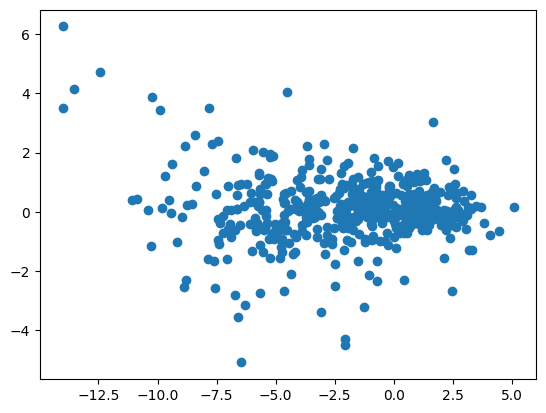

In [ ]:
# 잔차 플랏
resid = y_test - y_pred

plt.scatter(y_pred, resid)
plt.show()

In [ ]:
# # RFE 실행 (최종적으로 10개의 특성 선택)
# num_features = [3, 5, 7, 10, 20]
# for i in num_features:
#     rfe = RFE(estimator=optimal_elastic_net, n_features_to_select= i)
#     rfe.fit(X_train, y_train)

#     # RFE로 선택된 특성 이름 확인
#     selected_features_indices = rfe.support_
#     selected_features_names = X.columns[selected_features_indices]
#     print("최종 선택된 특성:", list(selected_features_names))

# # # 최종 선택된 특성으로 데이터프레임 생성
# # df_final_selected = ISIS_df[selected_features_names.tolist() + ['target']]
# # print("최종 데이터프레임:")
# # print(df_final_selected.head())